In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function
from __future__ import unicode_literals

import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix

import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt

import json
import os
import pprint
import collections
# COCO API
from pycocotools import mask as COCOmask
from pycocotools.coco import COCO

In [2]:
category_to_id = {
    'bicycle': 1,
    'car': 2,
    'person': 3,
    'train': 4,
    'truck': 5,
    'motorcycle': 6,
    'bus': 7,
    'rider': 8,
}
category_instancesonly = [
    'bicycle',
    'car',
    'person',
    'train',
    'truck',
    'motorcycle',
    'bus',
    'rider',
]
# id_to_category = {
#     '1': 'bicycle',
#     '2': 'car',
#     '3': 'person',
#     '4': 'train',
#     '5': 'truck',
#     '6': 'motorcycle',
#     '7': 'bus',
#     '8': 'rider',
# }

# Cityscapes 训练集数据分析

## 读取文件

In [3]:
root_dir = '/home/tianliang/SSAP2/Cloud/Dataset/Cityscapes/json_files'
json_name = 'instancesonly_filtered_gtFine_train.json'
json_file = os.path.join(root_dir, json_name)
print('读取标注文件: ', json_file)
anns = json.load(open(json_file))
print('json文件字典中的关键字: ', anns.keys())
# coco = COCO(json_file)

读取标注文件:  /home/tianliang/SSAP2/Cloud/Dataset/Cityscapes/json_files/instancesonly_filtered_gtFine_train.json
json文件字典中的关键字:  [u'images', u'annotations', u'categories']


## 标注文件格式分析

In [4]:
print('annotations 中的关键字:', anns['annotations'][0].keys())
print('类别: ')
pprint.pprint(anns['categories'])
print('包含图片的数量: ', len(anns['images']))
print('包含示例的数量: ', len(anns['annotations']))

annotations 中的关键字: [u'segmentation', u'area', u'iscrowd', u'image_id', u'bbox', u'category_id', u'id']
类别: 
[{u'id': 3, u'name': u'person'},
 {u'id': 4, u'name': u'train'},
 {u'id': 1, u'name': u'bicycle'},
 {u'id': 6, u'name': u'motorcycle'},
 {u'id': 7, u'name': u'bus'},
 {u'id': 2, u'name': u'car'},
 {u'id': 5, u'name': u'truck'},
 {u'id': 8, u'name': u'rider'}]
包含图片的数量:  2975
包含示例的数量:  50347


## 使用`pandas`成成DataFrame类型的数据格式

In [5]:
id_to_category = {}
for object_cls in anns['categories']:
    print(object_cls)
    if str(object_cls['id']) not in id_to_category:
        id_to_category[str(object_cls['id'])] = object_cls['name']
print(id_to_category)

{u'id': 3, u'name': u'person'}
{u'id': 4, u'name': u'train'}
{u'id': 1, u'name': u'bicycle'}
{u'id': 6, u'name': u'motorcycle'}
{u'id': 7, u'name': u'bus'}
{u'id': 2, u'name': u'car'}
{u'id': 5, u'name': u'truck'}
{u'id': 8, u'name': u'rider'}
{'1': u'bicycle', '3': u'person', '2': u'car', '5': u'truck', '4': u'train', '7': u'bus', '6': u'motorcycle', '8': u'rider'}


In [6]:
bboxes = np.empty((len(anns['annotations']), 9))
dic = collections.OrderedDict()
dic['category_num'] = []
dic['category'] = []
dic['x1'] = []
dic['y1'] = []
dic['w'] = []
dic['h'] = []
dic['aspect'] = []
dic['log_aspect'] = []
dic['area'] = []
dic['log_area'] = []
for i in range(len(anns['annotations'])):
    bbox = anns['annotations'][i]['bbox']
    dic['category_num'].append(anns['annotations'][i]['category_id'])
    dic['category'].append(id_to_category[str(anns['annotations'][i]['category_id'])])
    dic['x1'].append(bbox[0])
    dic['y1'].append(bbox[1])
    dic['w'].append(bbox[2])
    dic['h'].append(bbox[3])
    dic['aspect'].append(float(bbox[2])/float(bbox[3]))
    dic['log_aspect']= np.log(float(bbox[2])/float(bbox[3]))
    dic['area'].append(anns['annotations'][i]['area'])
    dic['log_area'].append(np.log(anns['annotations'][i]['area']))

df = pd.DataFrame(dic)

print(df.head())

   category_num category      x1     y1      w      h    aspect  log_aspect  \
0             1  bicycle   792.0  446.0   37.0   44.0  0.840909   -1.167605   
1             1  bicycle  1839.0  468.0   39.0   79.0  0.493671   -1.167605   
2             8    rider  1831.0  440.0   57.0  108.0  0.527778   -1.167605   
3             2      car  1966.0  488.0   77.0   34.0  2.264706   -1.167605   
4             2      car  1512.0  446.0  149.0   53.0  2.811321   -1.167605   

   area  log_area  
0   830  6.721426  
1  1479  7.299121  
2  2270  7.727535  
3  2129  7.663408  
4  1636  7.400010  


## 目标类别分析

In [7]:
df["category"] = df["category"].astype("category")
print(df["category"].head())

0    bicycle
1    bicycle
2      rider
3        car
4        car
Name: category, dtype: category
Categories (8, object): [bicycle, bus, car, motorcycle, person, rider, train, truck]


In [8]:
print('每个类别的数量: ')
df.groupby("category").size()

每个类别的数量: 


category
bicycle        3433
bus             350
car           26180
motorcycle      705
person        17395
rider          1660
train           158
truck           466
dtype: int64

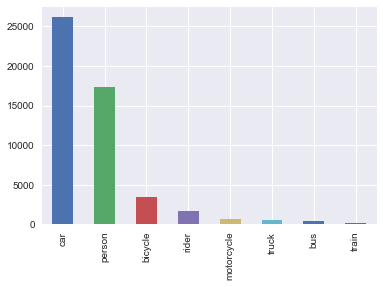

In [9]:
category_counts = df['category'].value_counts()
category_counts.plot.bar()
plt.show()

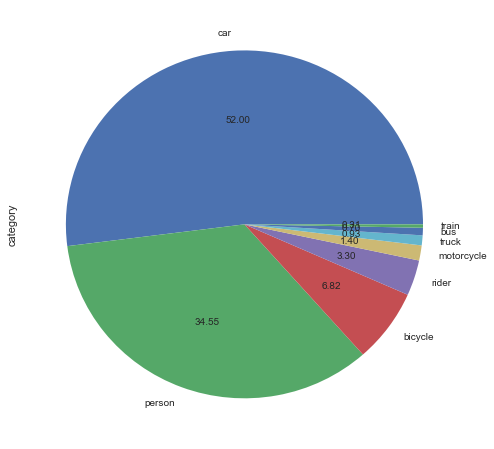

In [10]:
category_counts.plot.pie(subplots=True, autopct='%.2f', fontsize=10, figsize=(8, 8))
plt.show()

## 整体数据分布情况

In [11]:
df.head()

,category_num,category,x1,y1,w,h,aspect,log_aspect,area,log_area
0,1,bicycle,792.0,446.0,37.0,44.0,0.840909,-1.167605,830,6.721426
1,1,bicycle,1839.0,468.0,39.0,79.0,0.493671,-1.167605,1479,7.299121
2,8,rider,1831.0,440.0,57.0,108.0,0.527778,-1.167605,2270,7.727535
3,2,car,1966.0,488.0,77.0,34.0,2.264706,-1.167605,2129,7.663408
4,2,car,1512.0,446.0,149.0,53.0,2.811321,-1.167605,1636,7.400010


In [13]:
# scatter_matrix(df, alpha=0.2, figsize=(12, 12), diagonal='kde')
# plt.show()

#### 使用seaborn绘制

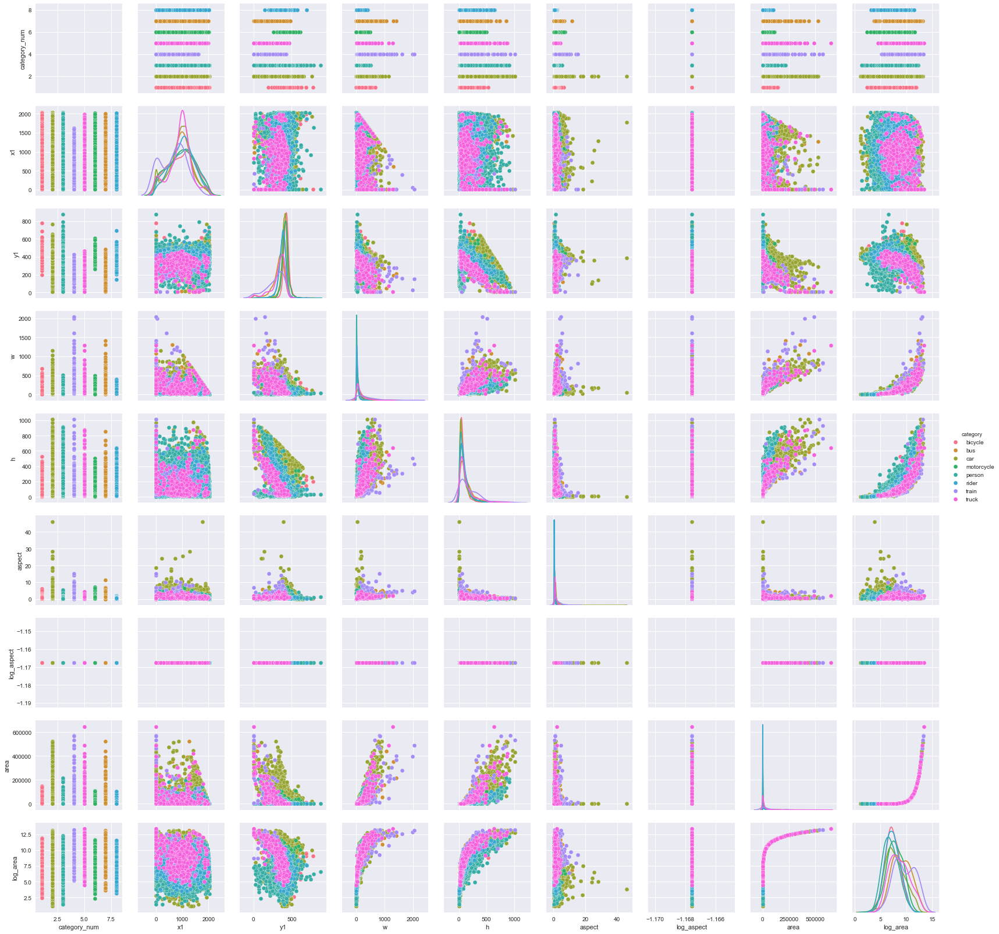

In [15]:
sns.pairplot(df, hue = 'category', diag_kind = 'kde')
plt.show()

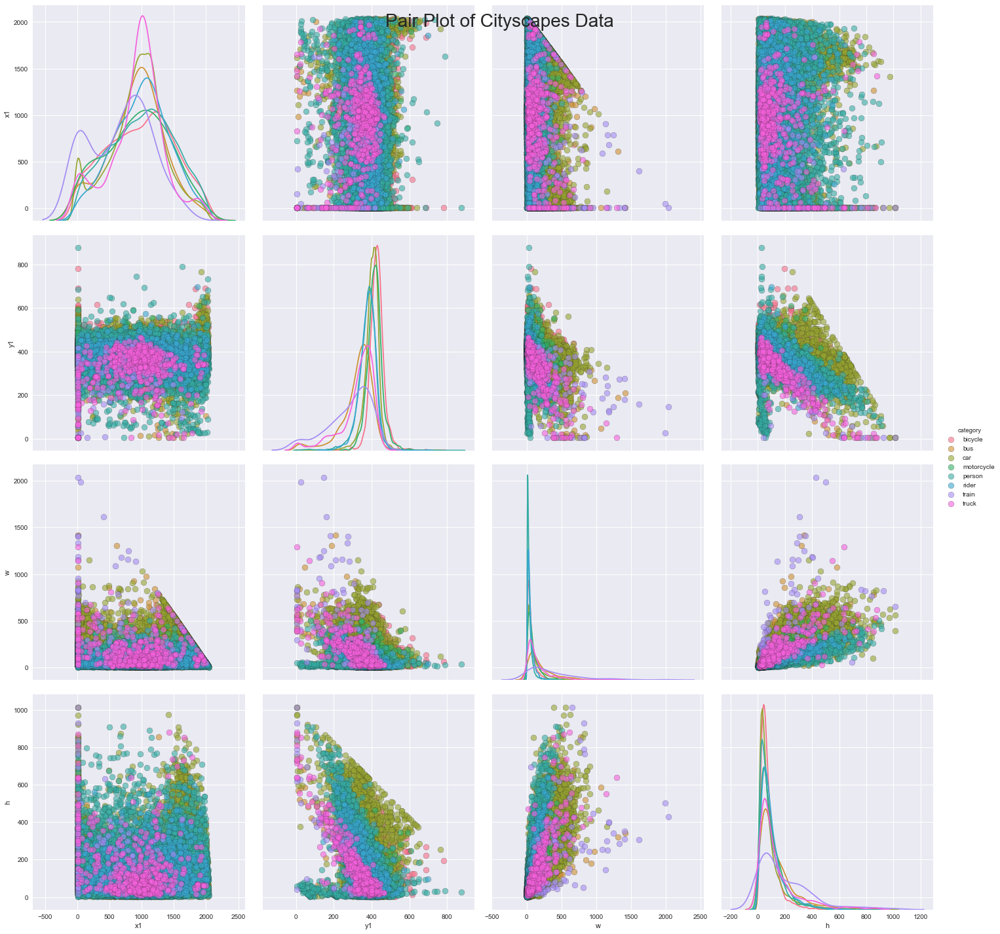

In [16]:
# Plot colored by category
sns.pairplot(df, 
             vars = ['x1', 'y1', 'w', 'h'], 
             hue = 'category', diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 5);
# Title 
plt.suptitle('Pair Plot of Cityscapes Data', 
             size = 28);
plt.show()

## 各个类别分布情况

class:  bicycle
count    3433.000000
mean       68.353627
std        67.537525
min         2.000000
25%        27.000000
50%        48.000000
75%        85.000000
max       678.000000
Name: w, dtype: float64


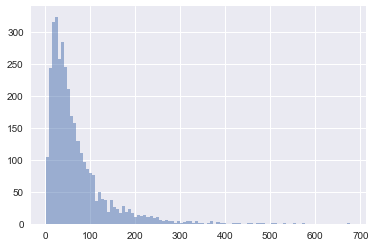

count    3433.000000
mean       81.773085
std        63.671565
min         4.000000
25%        40.000000
50%        63.000000
75%       104.000000
max       529.000000
Name: h, dtype: float64


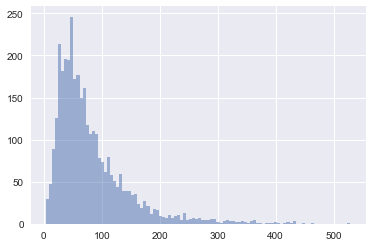

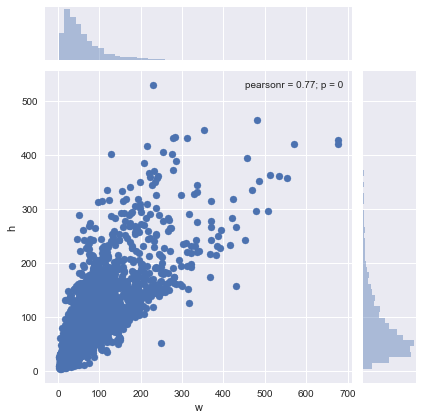

--------------------------------------------------------------------------------
class:  car
count    26180.000000
mean       113.570168
std        118.802305
min          1.000000
25%         35.000000
50%         69.000000
75%        145.000000
max       1148.000000
Name: w, dtype: float64


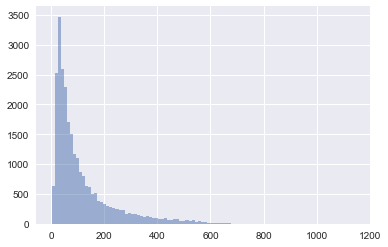

count    26180.000000
mean        97.330252
std        107.344138
min          1.000000
25%         33.000000
50%         60.000000
75%        116.000000
max       1014.000000
Name: h, dtype: float64


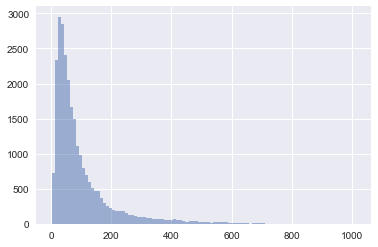

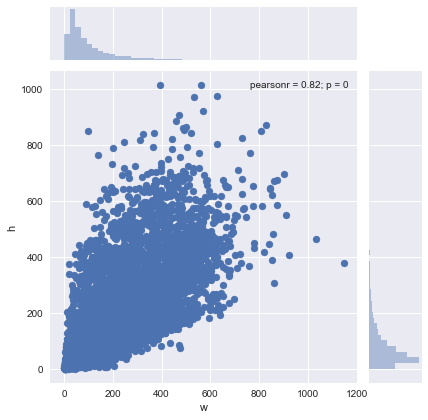

--------------------------------------------------------------------------------
class:  person
count    17395.000000
mean        41.005174
std         40.216281
min          1.000000
25%         17.000000
50%         28.000000
75%         50.000000
max        504.000000
Name: w, dtype: float64


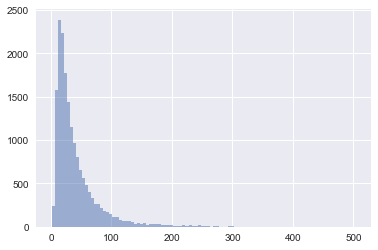

count    17395.000000
mean        99.399540
std         99.084937
min          2.000000
25%         35.000000
50%         67.000000
75%        128.000000
max        912.000000
Name: h, dtype: float64


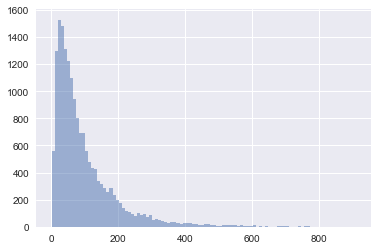

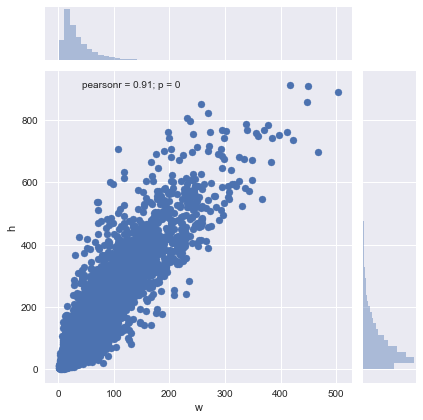

--------------------------------------------------------------------------------
class:  train
count     158.000000
mean      377.069620
std       387.783381
min        14.000000
25%        99.500000
50%       236.000000
75%       535.250000
max      2037.000000
Name: w, dtype: float64


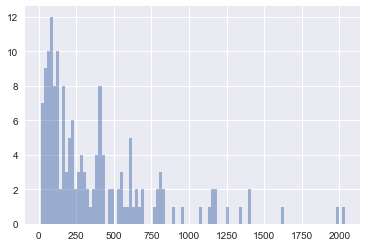

count     158.000000
mean      191.917722
std       194.716091
min        14.000000
25%        45.250000
50%       121.500000
75%       291.250000
max      1014.000000
Name: h, dtype: float64


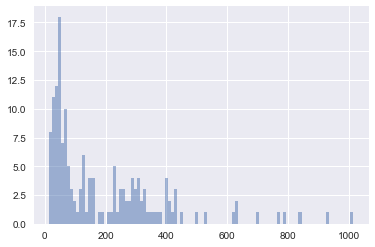

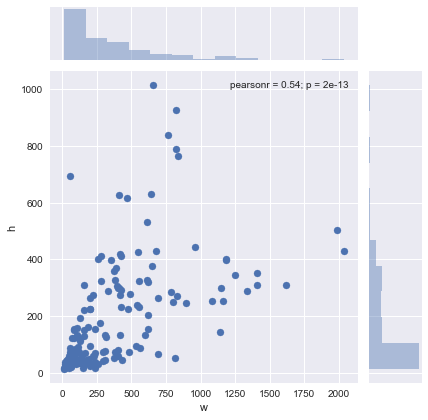

--------------------------------------------------------------------------------
class:  truck
count     466.000000
mean      155.201717
std       166.403351
min         4.000000
25%        46.000000
50%        95.000000
75%       197.750000
max      1293.000000
Name: w, dtype: float64


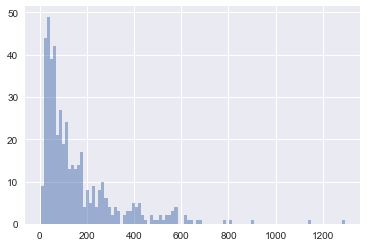

count    466.000000
mean     143.160944
std      154.702524
min       11.000000
25%       43.250000
50%       85.500000
75%      178.000000
max      880.000000
Name: h, dtype: float64


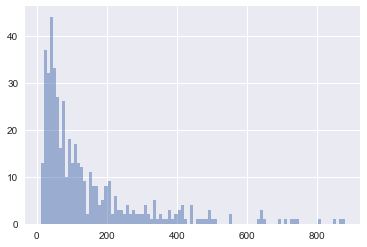

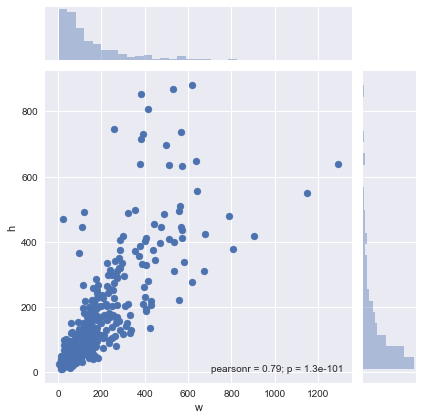

--------------------------------------------------------------------------------
class:  motorcycle
count    705.000000
mean      88.112057
std       78.432333
min        4.000000
25%       33.000000
50%       63.000000
75%      117.000000
max      498.000000
Name: w, dtype: float64


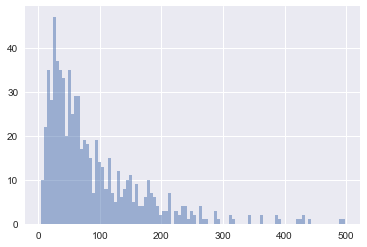

count    705.000000
mean     100.019858
std       82.141868
min        3.000000
25%       41.000000
50%       73.000000
75%      135.000000
max      501.000000
Name: h, dtype: float64


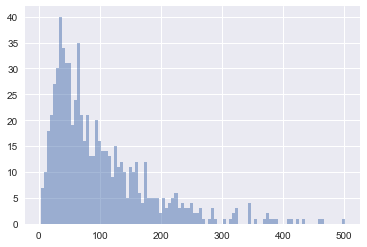

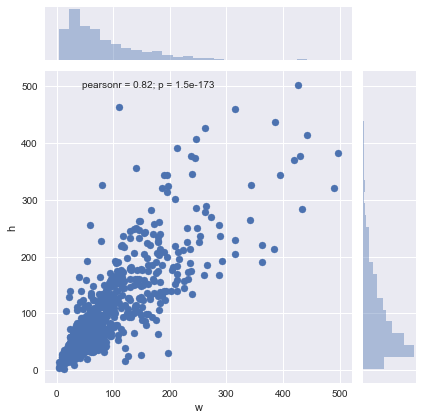

--------------------------------------------------------------------------------
class:  bus
count     350.000000
mean      208.711429
std       210.516324
min         4.000000
25%        64.000000
50%       134.000000
75%       279.500000
max      1418.000000
Name: w, dtype: float64


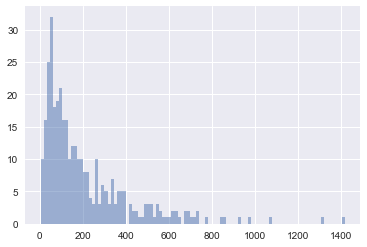

count    350.000000
mean     138.634286
std      131.867468
min        6.000000
25%       49.000000
50%       95.000000
75%      181.750000
max      856.000000
Name: h, dtype: float64


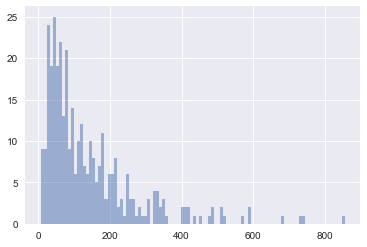

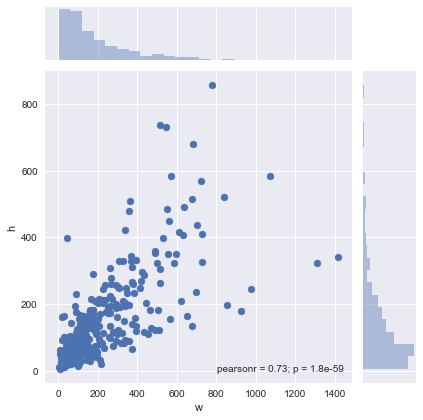

--------------------------------------------------------------------------------
class:  rider
count    1660.000000
mean       55.285542
std        48.139895
min         6.000000
25%        24.000000
50%        40.000000
75%        68.250000
max       401.000000
Name: w, dtype: float64


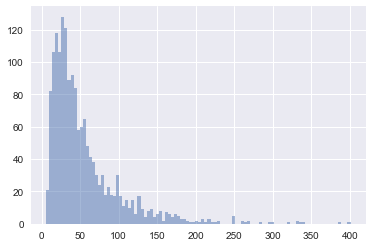

count    1660.000000
mean      109.315663
std        91.755416
min         5.000000
25%        47.000000
50%        81.000000
75%       140.000000
max       639.000000
Name: h, dtype: float64


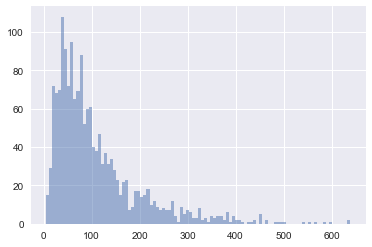

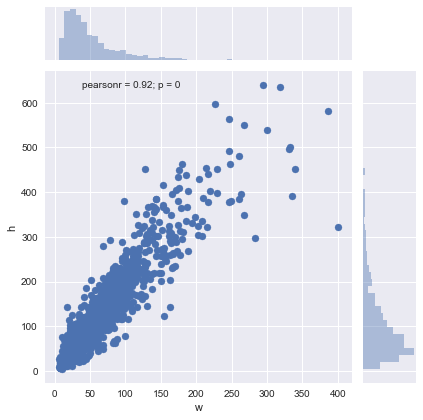

--------------------------------------------------------------------------------


In [17]:
for cls in category_instancesonly:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    df2['w'].hist(color='b', alpha=0.5, bins=100)
    # 使用seaborn绘制
    # sns.distplot(df2['w'], bins=100, kde=True, rug=True);
    print(df2['w'].describe())
    plt.show()
    df2['h'].hist(color='b', alpha=0.5, bins=100)
    # 使用seaborn绘制
    # sns.distplot(df2['h'], bins=100, kde=True, rug=True);
    print(df2['h'].describe())
    plt.show()
    sns.jointplot(x="w", y="h", data=df[df['category']==cls]);
    plt.show()
    print(80*'-')

### 宽高比

class:  bicycle
count    3433.000000
mean        0.863636
std         0.510076
min         0.098361
25%         0.516667
50%         0.720000
75%         1.126126
max         6.300000
Name: aspect, dtype: float64


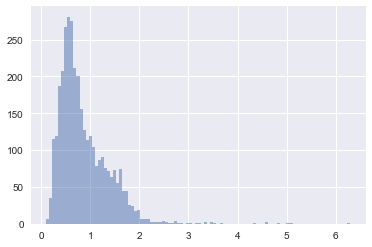

--------------------------------------------------------------------------------
class:  car
count    26180.000000
mean         1.323748
std          0.921129
min          0.049505
25%          0.860000
50%          1.190476
75%          1.503191
max         46.000000
Name: aspect, dtype: float64


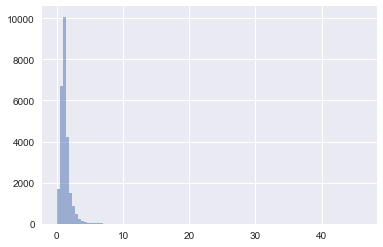

--------------------------------------------------------------------------------
class:  person
count    17395.000000
mean         0.505786
std          0.305932
min          0.052288
25%          0.338129
50%          0.415254
75%          0.556421
max          5.500000
Name: aspect, dtype: float64


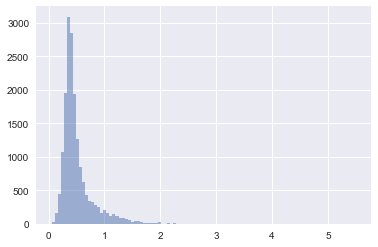

--------------------------------------------------------------------------------
class:  train
count    158.000000
mean       2.727621
std        2.542821
min        0.082014
25%        1.024022
50%        1.776721
75%        3.664286
max       15.320755
Name: aspect, dtype: float64


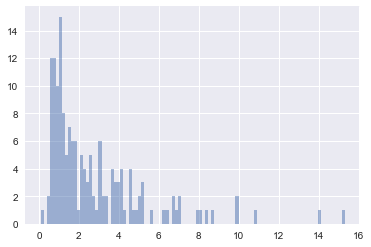

--------------------------------------------------------------------------------
class:  truck
count    466.000000
mean       1.210842
std        0.635447
min        0.050955
25%        0.822062
50%        1.000000
75%        1.474959
max        4.302326
Name: aspect, dtype: float64


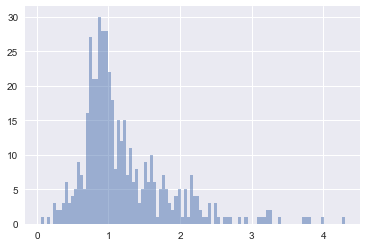

--------------------------------------------------------------------------------
class:  motorcycle
count    705.000000
mean       0.949266
std        0.585802
min        0.163462
25%        0.635417
50%        0.814815
75%        1.133333
max        7.117647
Name: aspect, dtype: float64


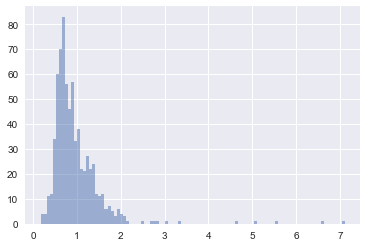

--------------------------------------------------------------------------------
class:  bus
count    350.000000
mean       1.715683
std        1.225592
min        0.108312
25%        0.974166
50%        1.342205
75%        2.017779
max       11.473684
Name: aspect, dtype: float64


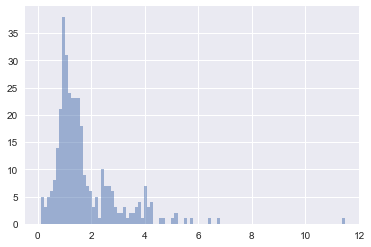

--------------------------------------------------------------------------------
class:  rider
count    1660.000000
mean        0.542779
std         0.201329
min         0.125000
25%         0.420413
50%         0.495061
75%         0.613011
max         2.000000
Name: aspect, dtype: float64


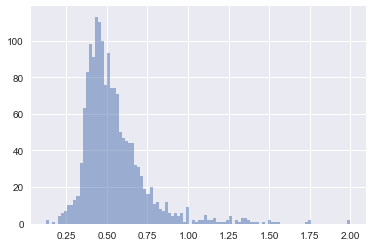

--------------------------------------------------------------------------------


In [18]:
for cls in category_instancesonly:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    df2 = df2['aspect']
    # df2.plot.hist(stacked=True, bins=100)
    df2.hist(color='b', alpha=0.5, bins=100)
    print(df2.describe())
    plt.show()
    print(80*'-')

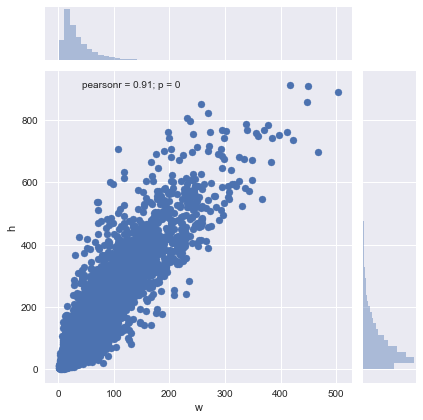

In [19]:
import seaborn as sns
sns.set(color_codes=True)

# w = df['w'].values
# h = df['h'].values
sns.jointplot(x="w", y="h", data=df[df['category']=='person']);
plt.show()

## 一个特定类别统计情况

class:  bicycle


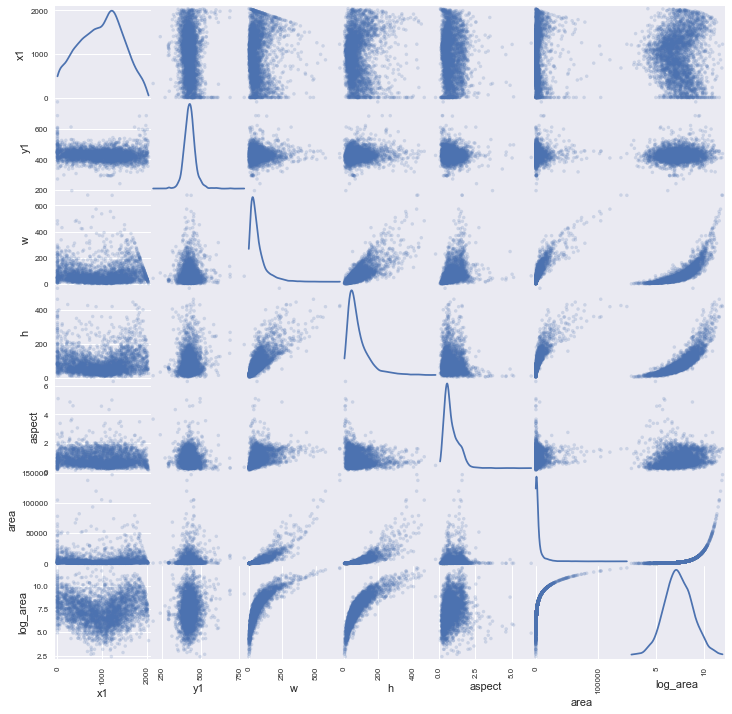

--------------------------------------------------------------------------------
class:  car


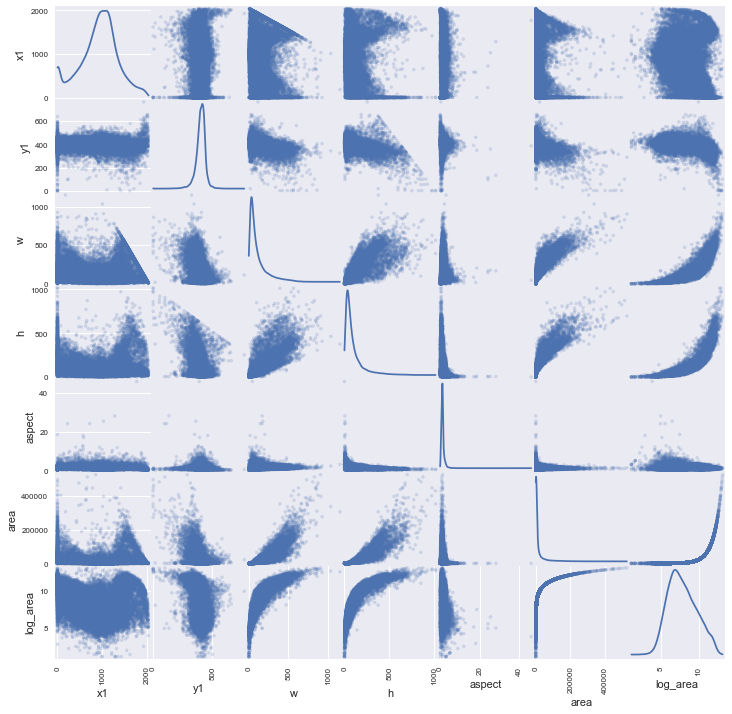

--------------------------------------------------------------------------------
class:  person


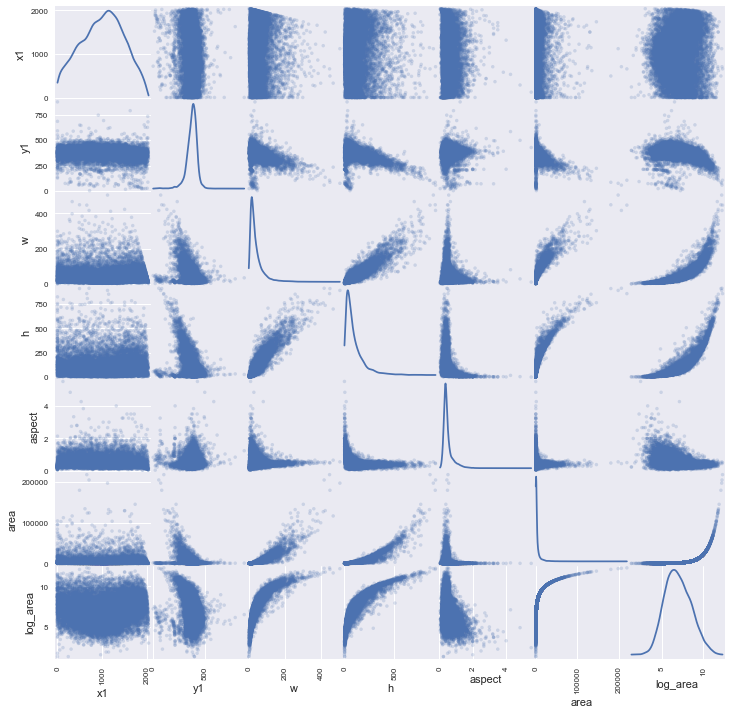

--------------------------------------------------------------------------------
class:  train


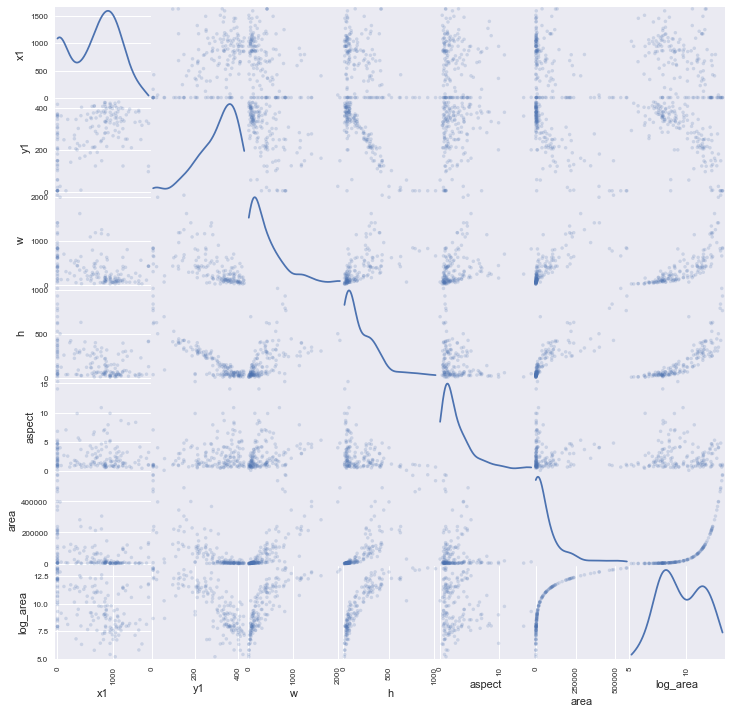

--------------------------------------------------------------------------------
class:  truck


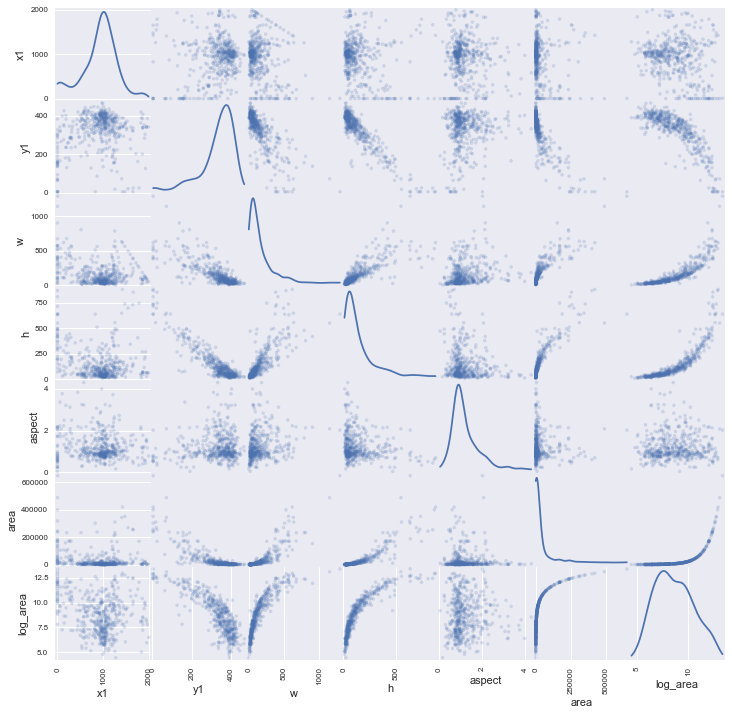

--------------------------------------------------------------------------------
class:  motorcycle


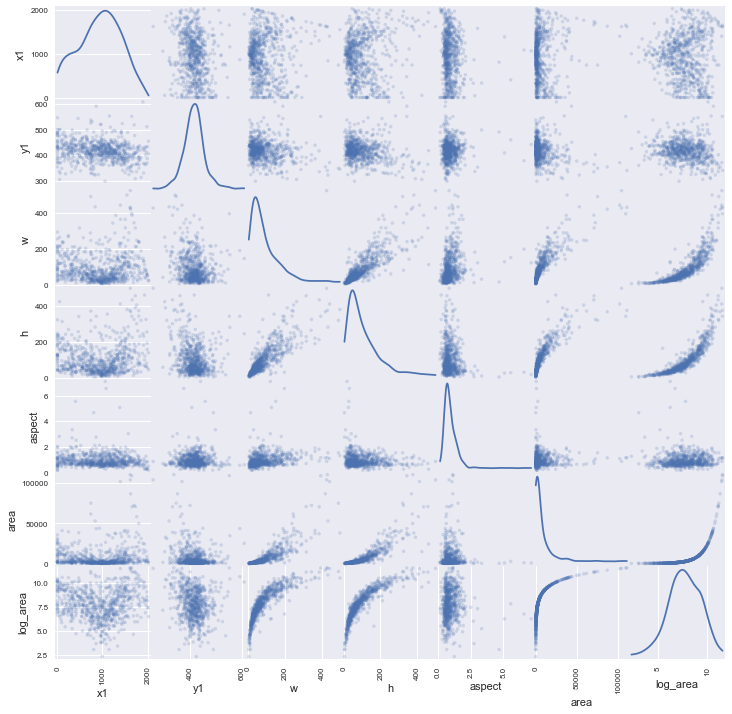

--------------------------------------------------------------------------------
class:  bus


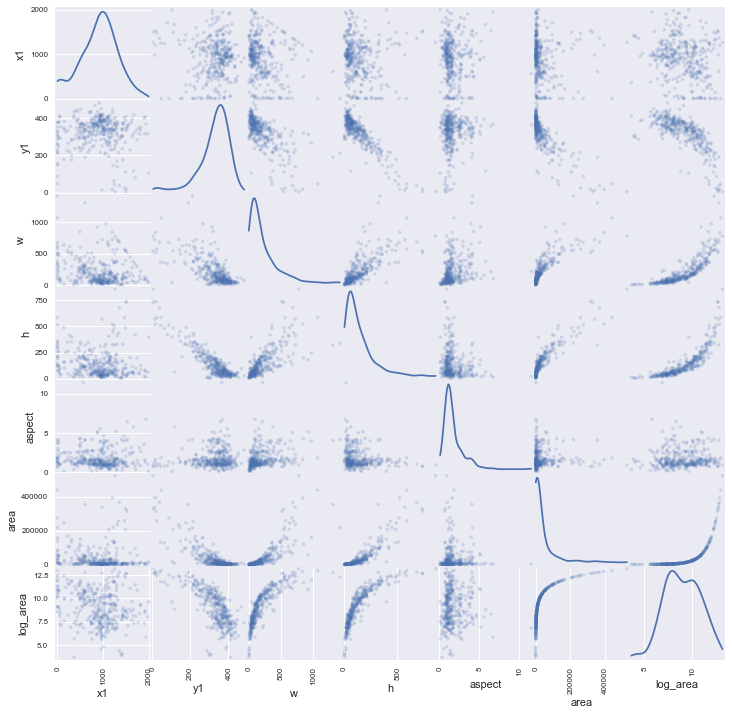

--------------------------------------------------------------------------------
class:  rider


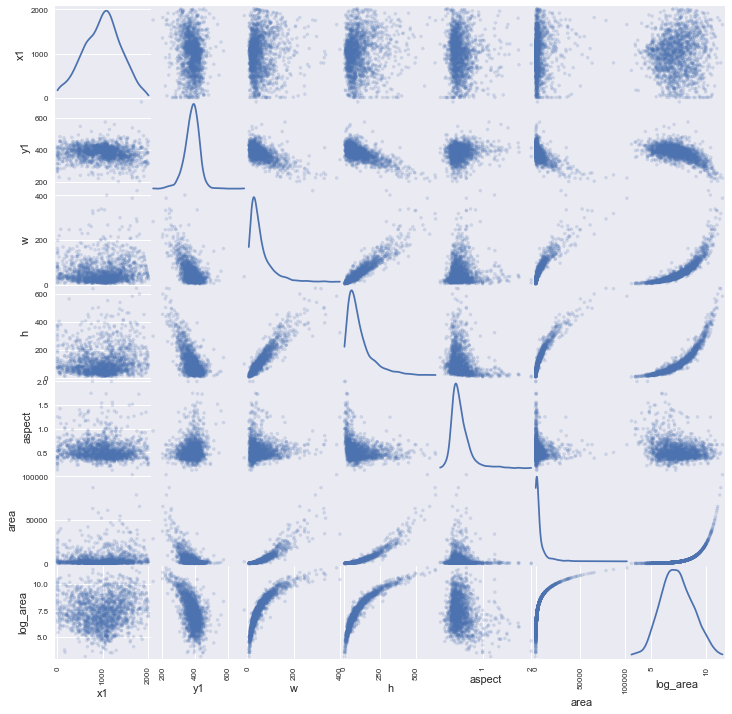

--------------------------------------------------------------------------------


In [20]:
for cls in category_instancesonly:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    # df2 = df2.iloc[:,2:]
    df2 = df2.iloc[:,[2,3,4,5,6,8,9]]
    scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
    plt.show()
    print(80*'-')

         x1     y1      w      h    aspect   area  log_area
2    1831.0  440.0   57.0  108.0  0.527778   2270  7.727535
72    774.0  419.0   33.0   67.0  0.492537    793  6.675823
125   628.0  391.0   68.0   58.0  1.172414    708  6.562444
159  1497.0  300.0  111.0  256.0  0.433594  13093  9.479833
221   441.0  401.0   17.0   74.0  0.229730    408  6.011267


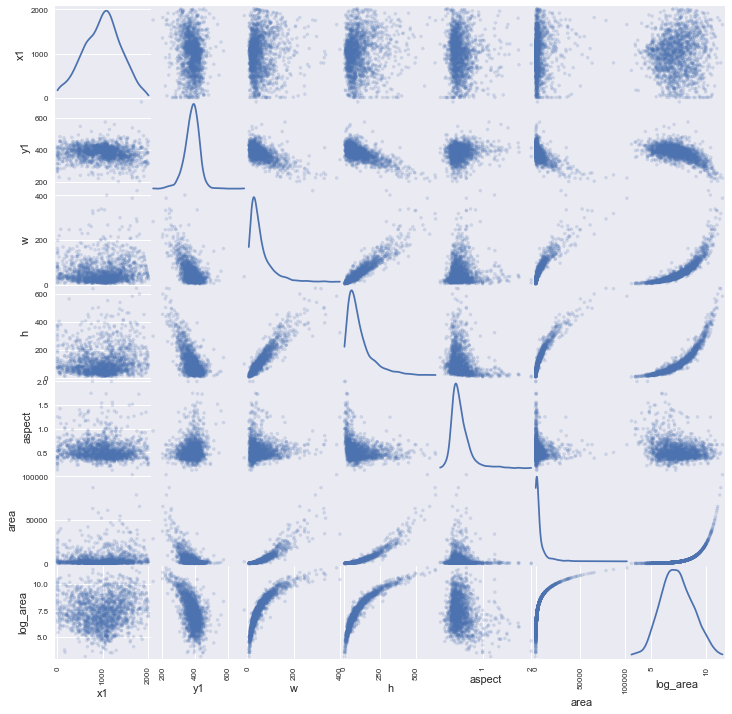

--------------------------------------------------------------------------------


In [21]:
df2 = df[df['category']=='rider']
df2 = df2.iloc[:,[2,3,4,5,6,8,9]]
print(df2.head())
scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
plt.show()
print(80*'-')

#### 使用seaborn绘制

         x1     y1      w      h    aspect   area  log_area
2    1831.0  440.0   57.0  108.0  0.527778   2270  7.727535
72    774.0  419.0   33.0   67.0  0.492537    793  6.675823
125   628.0  391.0   68.0   58.0  1.172414    708  6.562444
159  1497.0  300.0  111.0  256.0  0.433594  13093  9.479833
221   441.0  401.0   17.0   74.0  0.229730    408  6.011267


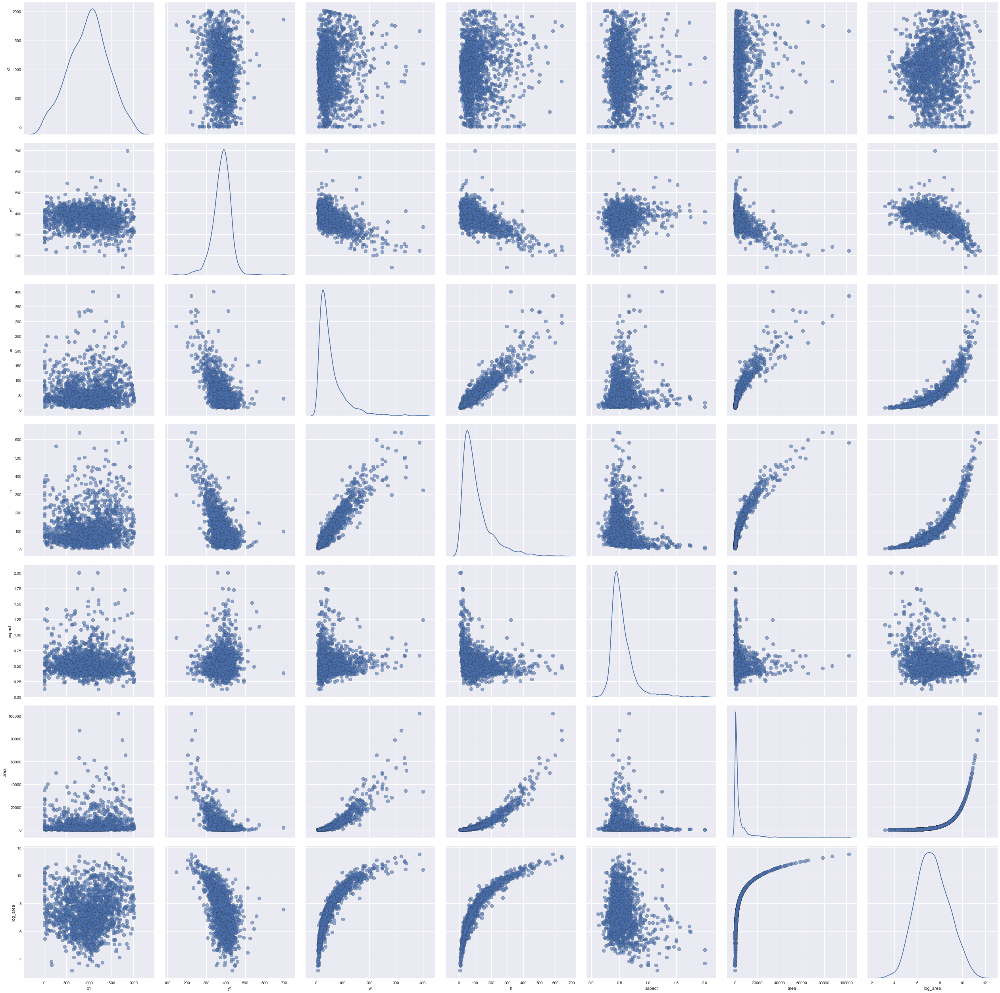

--------------------------------------------------------------------------------


In [22]:
df2 = df[df['category']=='rider']
df2 = df2.iloc[:,[2,3,4,5,6,8,9]]
print(df2.head())
# scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
sns.pairplot(df2, diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 5)
plt.show()
print(80*'-')

# Cityscapes 验证集数据分析

## 读取文件

In [23]:
root_dir = '/home/tianliang/SSAP2/Cloud/Dataset/Cityscapes/json_files'
json_name = 'instancesonly_filtered_gtFine_val.json'
json_file = os.path.join(root_dir, json_name)
print('读取标注文件: ', json_file)
anns = json.load(open(json_file))
print('json文件字典中的关键字: ', anns.keys())
# coco = COCO(json_file)

读取标注文件:  /home/tianliang/SSAP2/Cloud/Dataset/Cityscapes/json_files/instancesonly_filtered_gtFine_val.json
json文件字典中的关键字:  [u'images', u'annotations', u'categories']


## 标注文件格式分析

In [24]:
print('annotations 中的关键字:', anns['annotations'][0].keys())
print('类别: ')
pprint.pprint(anns['categories'])
print('包含图片的数量: ', len(anns['images']))
print('包含示例的数量: ', len(anns['annotations']))

annotations 中的关键字: [u'segmentation', u'area', u'iscrowd', u'image_id', u'bbox', u'category_id', u'id']
类别: 
[{u'id': 3, u'name': u'person'},
 {u'id': 4, u'name': u'train'},
 {u'id': 1, u'name': u'bicycle'},
 {u'id': 6, u'name': u'motorcycle'},
 {u'id': 7, u'name': u'bus'},
 {u'id': 2, u'name': u'car'},
 {u'id': 5, u'name': u'truck'},
 {u'id': 8, u'name': u'rider'}]
包含图片的数量:  500
包含示例的数量:  9792


## 使用`pandas`成成DataFrame类型的数据格式

In [25]:
id_to_category = {}
for object_cls in anns['categories']:
    print(object_cls)
    if str(object_cls['id']) not in id_to_category:
        id_to_category[str(object_cls['id'])] = object_cls['name']
print(id_to_category)

{u'id': 3, u'name': u'person'}
{u'id': 4, u'name': u'train'}
{u'id': 1, u'name': u'bicycle'}
{u'id': 6, u'name': u'motorcycle'}
{u'id': 7, u'name': u'bus'}
{u'id': 2, u'name': u'car'}
{u'id': 5, u'name': u'truck'}
{u'id': 8, u'name': u'rider'}
{'1': u'bicycle', '3': u'person', '2': u'car', '5': u'truck', '4': u'train', '7': u'bus', '6': u'motorcycle', '8': u'rider'}


In [26]:
bboxes = np.empty((len(anns['annotations']), 9))
dic = collections.OrderedDict()
dic['category_num'] = []
dic['category'] = []
dic['x1'] = []
dic['y1'] = []
dic['w'] = []
dic['h'] = []
dic['aspect'] = []
dic['log_aspect'] = []
dic['area'] = []
dic['log_area'] = []
for i in range(len(anns['annotations'])):
    bbox = anns['annotations'][i]['bbox']
    dic['category_num'].append(anns['annotations'][i]['category_id'])
    dic['category'].append(id_to_category[str(anns['annotations'][i]['category_id'])])
    dic['x1'].append(bbox[0])
    dic['y1'].append(bbox[1])
    dic['w'].append(bbox[2])
    dic['h'].append(bbox[3])
    dic['aspect'].append(float(bbox[2])/float(bbox[3]))
    dic['log_aspect']= np.log(float(bbox[2])/float(bbox[3]))
    dic['area'].append(anns['annotations'][i]['area'])
    dic['log_area'].append(np.log(anns['annotations'][i]['area']))

df = pd.DataFrame(dic)

print(df.head())

   category_num category      x1     y1      w      h    aspect  log_aspect  \
0             2      car  1006.0  410.0   22.0   25.0  0.880000    -2.08406   
1             2      car  1022.0  368.0  146.0  136.0  1.073529    -2.08406   
2             2      car  1251.0  306.0  516.0  270.0  1.911111    -2.08406   
3             3   person   949.0  406.0   17.0   39.0  0.435897    -2.08406   
4             3   person  1157.0  374.0   45.0   99.0  0.454545    -2.08406   

     area   log_area  
0     404   6.001415  
1   14268   9.565775  
2  100584  11.518748  
3     413   6.023448  
4    2709   7.904335  


## 目标类别分析

In [27]:
df["category"] = df["category"].astype("category")
print(df["category"].head())

0       car
1       car
2       car
3    person
4    person
Name: category, dtype: category
Categories (8, object): [bicycle, bus, car, motorcycle, person, rider, train, truck]


In [28]:
print('每个类别的数量: ')
df.groupby("category").size()

每个类别的数量: 


category
bicycle       1115
bus             97
car           4524
motorcycle     143
person        3278
rider          521
train           22
truck           92
dtype: int64

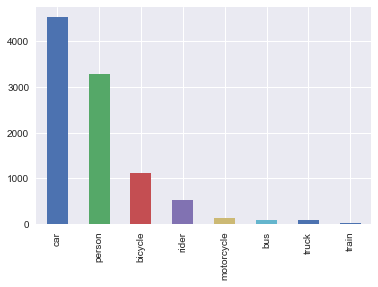

In [29]:
category_counts = df['category'].value_counts()
category_counts.plot.bar()
plt.show()

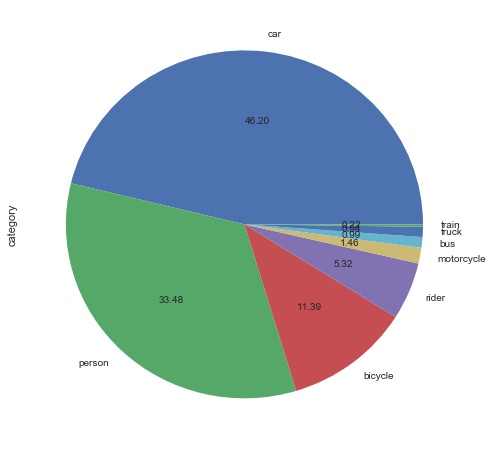

In [30]:
category_counts.plot.pie(subplots=True, autopct='%.2f', fontsize=10, figsize=(8, 8))
plt.show()

## 整体数据分布情况

In [31]:
df.head()

,category_num,category,x1,y1,w,h,aspect,log_aspect,area,log_area
0,2,car,1006.0,410.0,22.0,25.0,0.880000,-2.08406,404,6.001415
1,2,car,1022.0,368.0,146.0,136.0,1.073529,-2.08406,14268,9.565775
2,2,car,1251.0,306.0,516.0,270.0,1.911111,-2.08406,100584,11.518748
3,3,person,949.0,406.0,17.0,39.0,0.435897,-2.08406,413,6.023448
4,3,person,1157.0,374.0,45.0,99.0,0.454545,-2.08406,2709,7.904335


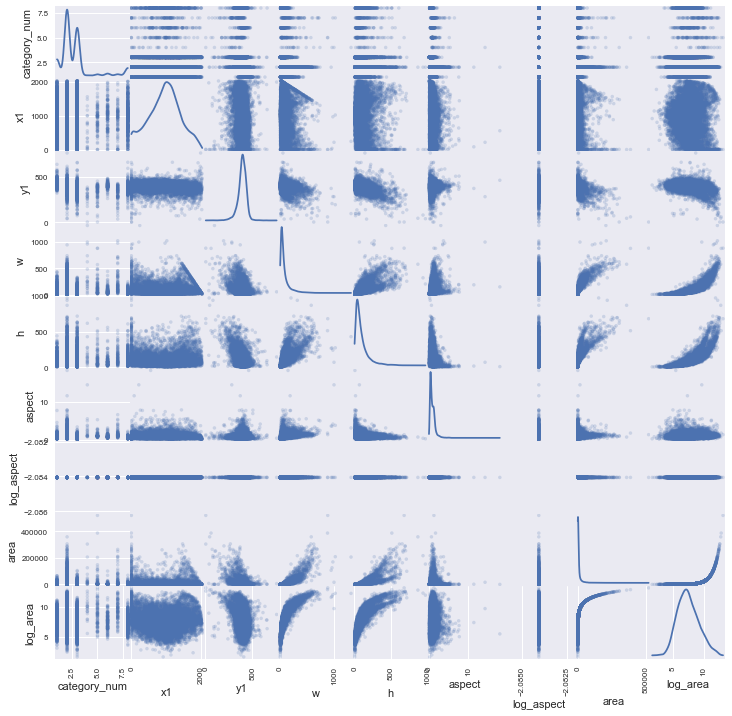

In [41]:
scatter_matrix(df, alpha=0.2, figsize=(12, 12), diagonal='kde')
plt.show()

#### 使用seaborn绘制

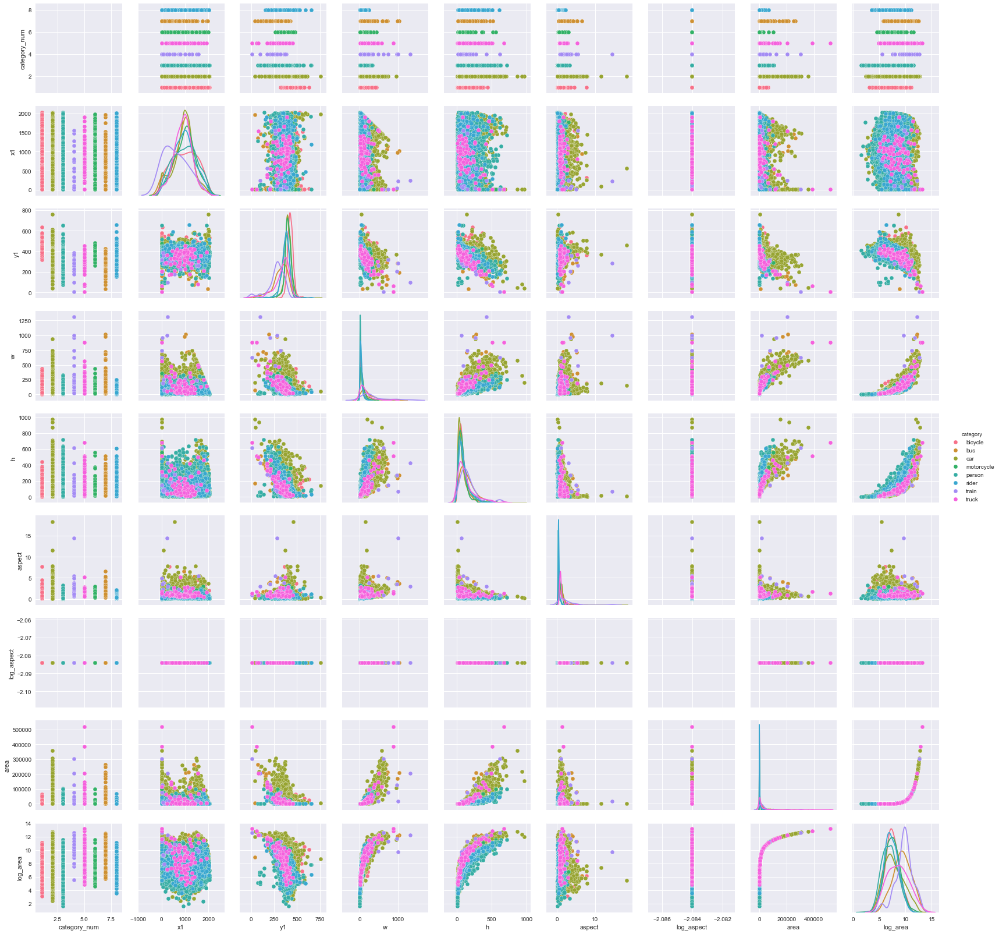

In [33]:
sns.pairplot(df, hue = 'category', diag_kind = 'kde')
plt.show()

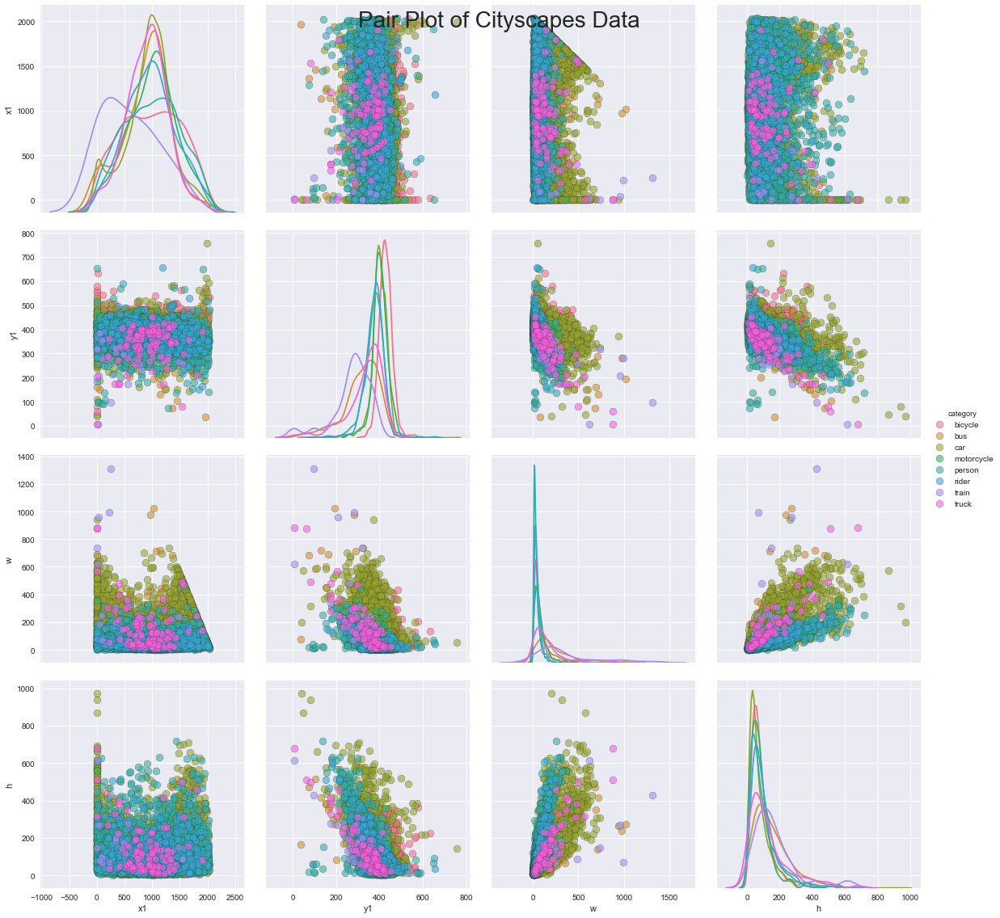

In [34]:
# Plot colored by continent for years 2000-2007
sns.pairplot(df, 
             vars = ['x1', 'y1', 'w', 'h'], 
             hue = 'category', diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4);
# Title 
plt.suptitle('Pair Plot of Cityscapes Data', 
             size = 28);
plt.show()

## 各个类别分布情况

class:  bicycle
count    1115.000000
mean       71.408072
std        65.333513
min         4.000000
25%        30.000000
50%        50.000000
75%        88.000000
max       434.000000
Name: w, dtype: float64


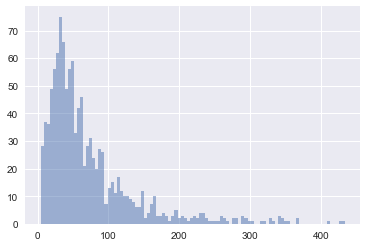

count    1115.000000
mean       87.858296
std        62.632793
min         3.000000
25%        45.000000
50%        70.000000
75%       111.000000
max       439.000000
Name: h, dtype: float64


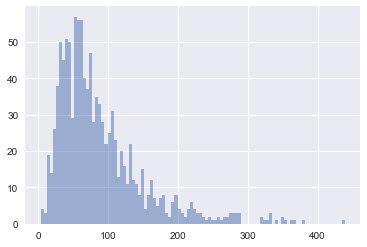

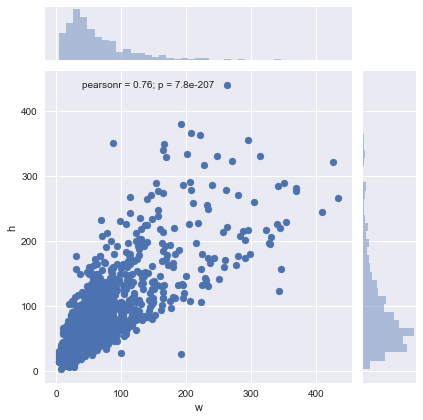

--------------------------------------------------------------------------------
class:  car
count    4524.000000
mean      107.093501
std       113.585158
min         3.000000
25%        33.000000
50%        64.000000
75%       136.000000
max       944.000000
Name: w, dtype: float64


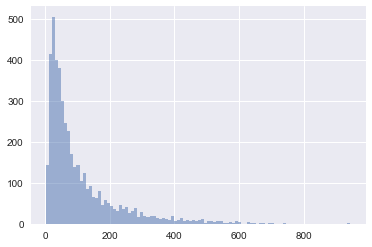

count    4524.000000
mean       93.101901
std       100.957970
min         4.000000
25%        33.000000
50%        59.000000
75%       112.000000
max       971.000000
Name: h, dtype: float64


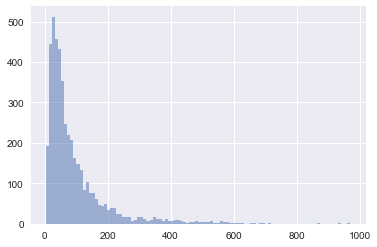

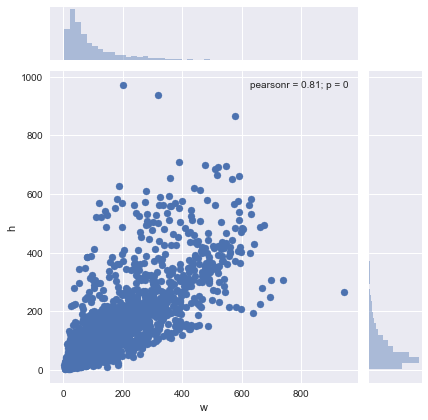

--------------------------------------------------------------------------------
class:  person
count    3278.000000
mean       41.483527
std        38.528980
min         1.000000
25%        17.000000
50%        29.000000
75%        51.000000
max       331.000000
Name: w, dtype: float64


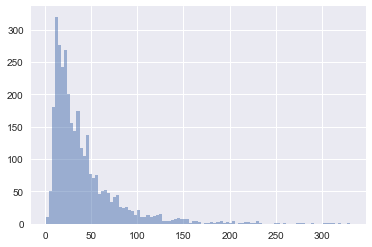

count    3278.000000
mean      100.862721
std        93.118839
min         3.000000
25%        38.000000
50%        71.000000
75%       130.000000
max       716.000000
Name: h, dtype: float64


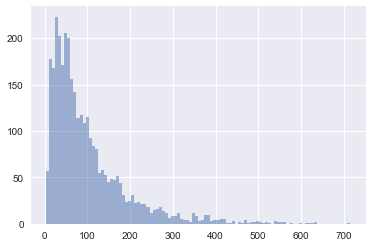

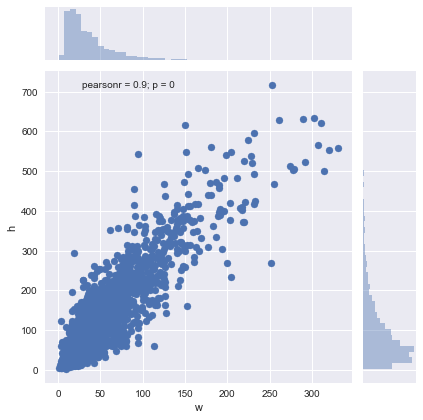

--------------------------------------------------------------------------------
class:  train
count      22.000000
mean      366.318182
std       346.557408
min        18.000000
25%       155.250000
50%       244.000000
75%       447.250000
max      1312.000000
Name: w, dtype: float64


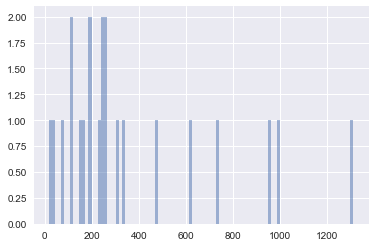

count     22.000000
mean     168.681818
std      136.936338
min       18.000000
25%       82.000000
50%      133.500000
75%      196.000000
max      616.000000
Name: h, dtype: float64


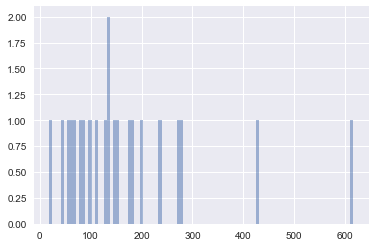

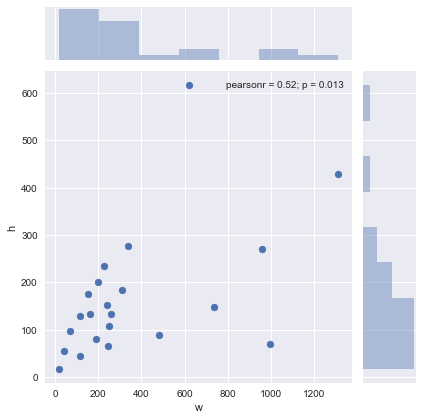

--------------------------------------------------------------------------------
class:  truck
count     92.000000
mean     151.619565
std      161.753702
min       14.000000
25%       41.750000
50%      105.500000
75%      193.250000
max      881.000000
Name: w, dtype: float64


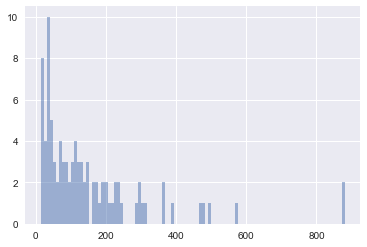

count     92.000000
mean     135.054348
std      129.308759
min       11.000000
25%       44.750000
50%       96.000000
75%      164.000000
max      680.000000
Name: h, dtype: float64


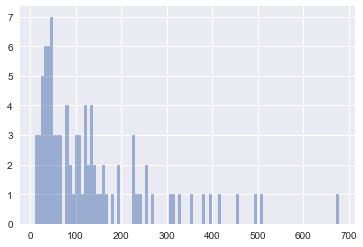

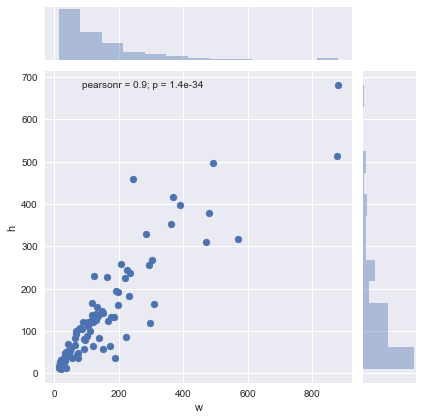

--------------------------------------------------------------------------------
class:  motorcycle
count    143.000000
mean      77.755245
std       67.214730
min        8.000000
25%       33.000000
50%       58.000000
75%      100.500000
max      439.000000
Name: w, dtype: float64


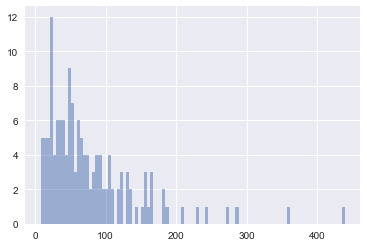

count    143.000000
mean      88.377622
std       81.659444
min       14.000000
25%       40.000000
50%       68.000000
75%      106.000000
max      558.000000
Name: h, dtype: float64


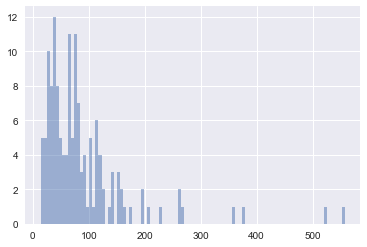

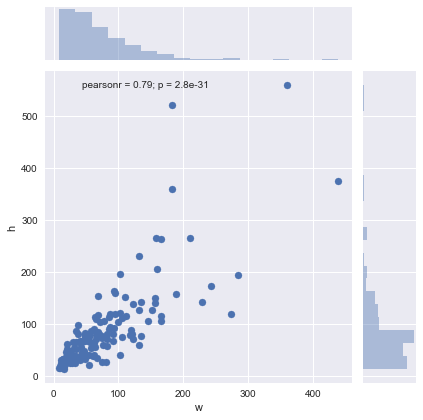

--------------------------------------------------------------------------------
class:  bus
count      97.000000
mean      221.072165
std       200.836026
min        13.000000
25%        87.000000
50%       157.000000
75%       318.000000
max      1021.000000
Name: w, dtype: float64


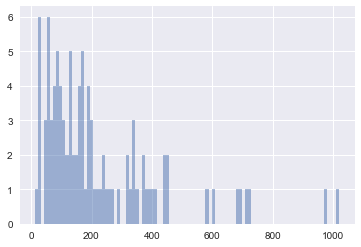

count     97.000000
mean     148.546392
std      106.033605
min       14.000000
25%       69.000000
50%      121.000000
75%      199.000000
max      515.000000
Name: h, dtype: float64


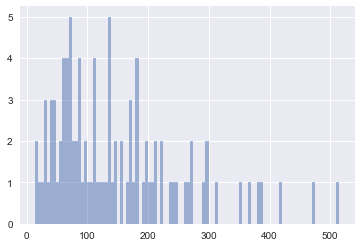

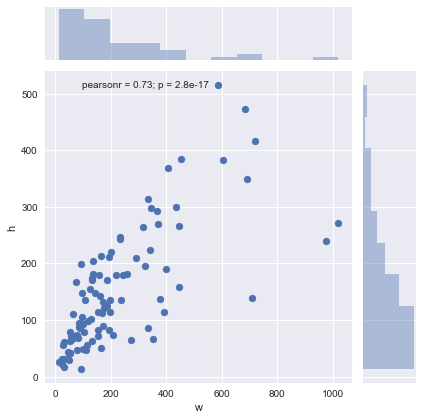

--------------------------------------------------------------------------------
class:  rider
count    521.000000
mean      51.042226
std       37.202075
min        5.000000
25%       25.000000
50%       40.000000
75%       65.000000
max      245.000000
Name: w, dtype: float64


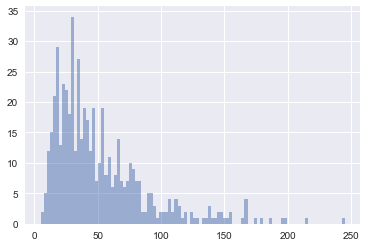

count    521.000000
mean     107.834933
std       84.963112
min       12.000000
25%       50.000000
50%       82.000000
75%      137.000000
max      607.000000
Name: h, dtype: float64


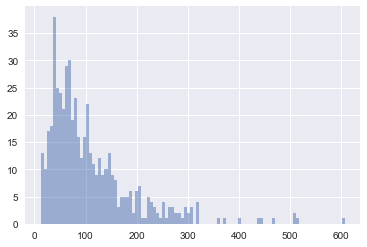

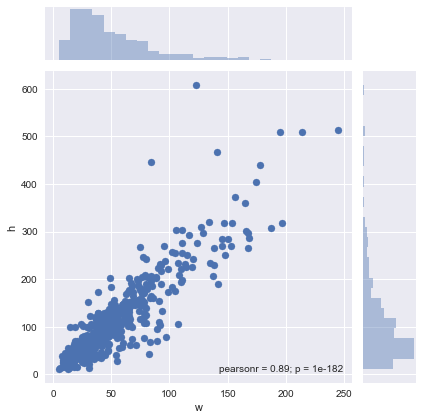

--------------------------------------------------------------------------------


In [35]:
for cls in category_instancesonly:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    df2['w'].hist(color='b', alpha=0.5, bins=100)
    # 使用seaborn绘制
    # sns.distplot(df2['w'], bins=100, kde=True, rug=True);
    print(df2['w'].describe())
    plt.show()
    df2['h'].hist(color='b', alpha=0.5, bins=100)
    # 使用seaborn绘制
    # sns.distplot(df2['h'], bins=100, kde=True, rug=True);
    print(df2['h'].describe())
    plt.show()
    sns.jointplot(x="w", y="h", data=df[df['category']==cls]);
    plt.show()
    print(80*'-')

### 宽高比

class:  bicycle
count    1115.000000
mean        0.841649
std         0.520499
min         0.142857
25%         0.509619
50%         0.684211
75%         1.080441
max         7.680000
Name: aspect, dtype: float64


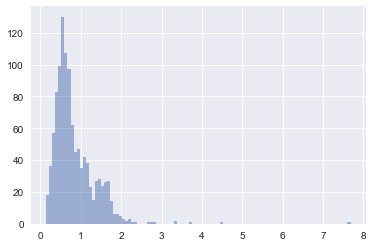

--------------------------------------------------------------------------------
class:  car
count    4524.000000
mean        1.266293
std         0.804572
min         0.124424
25%         0.800000
50%         1.157895
75%         1.445641
max        18.250000
Name: aspect, dtype: float64


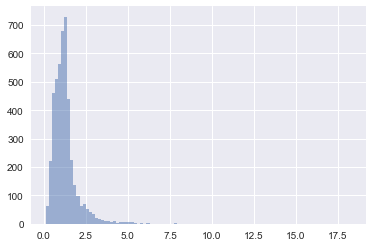

--------------------------------------------------------------------------------
class:  person
count    3278.000000
mean        0.491508
std         0.278670
min         0.024590
25%         0.333333
50%         0.410671
75%         0.552592
max         3.333333
Name: aspect, dtype: float64


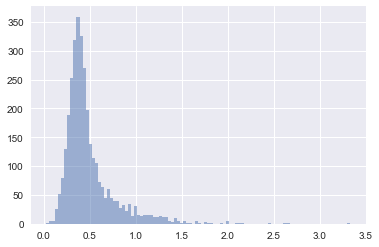

--------------------------------------------------------------------------------
class:  train
count    22.000000
mean      2.613053
std       2.977808
min       0.732143
25%       0.992500
50%       1.635408
75%       2.954621
max      14.449275
Name: aspect, dtype: float64


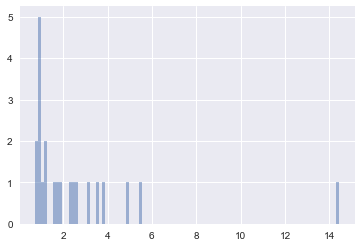

--------------------------------------------------------------------------------
class:  truck
count    92.000000
mean      1.176966
std       0.654894
min       0.534783
25%       0.842493
50%       0.987413
75%       1.266571
max       5.250000
Name: aspect, dtype: float64


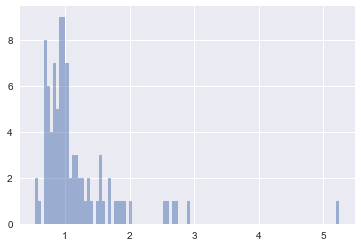

--------------------------------------------------------------------------------
class:  motorcycle
count    143.000000
mean       0.944572
std        0.487511
min        0.338710
25%        0.598023
50%        0.821429
75%        1.165152
max        3.076923
Name: aspect, dtype: float64


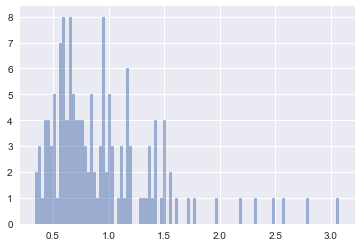

--------------------------------------------------------------------------------
class:  bus
count    97.000000
mean      1.580021
std       1.088801
min       0.449102
25%       0.947368
50%       1.267327
75%       1.730769
max       6.571429
Name: aspect, dtype: float64


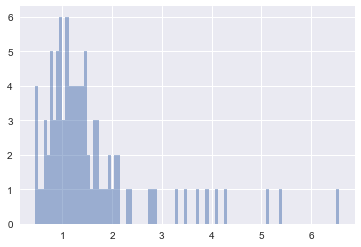

--------------------------------------------------------------------------------
class:  rider
count    521.000000
mean       0.523084
std        0.228087
min        0.151515
25%        0.399317
50%        0.465116
75%        0.568421
max        2.214286
Name: aspect, dtype: float64


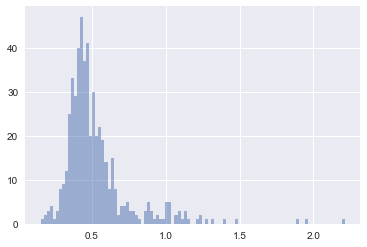

--------------------------------------------------------------------------------


In [36]:
for cls in category_instancesonly:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    df2 = df2['aspect']
    # df2.plot.hist(stacked=True, bins=100)
    df2.hist(color='b', alpha=0.5, bins=100)
    print(df2.describe())
    plt.show()
    print(80*'-')

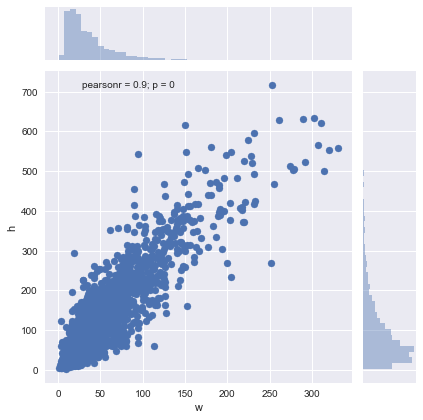

In [37]:
import seaborn as sns
sns.set(color_codes=True)

# w = df['w'].values
# h = df['h'].values
sns.jointplot(x="w", y="h", data=df[df['category']=='person']);
plt.show()

## 一个特定类别统计情况

class:  bicycle


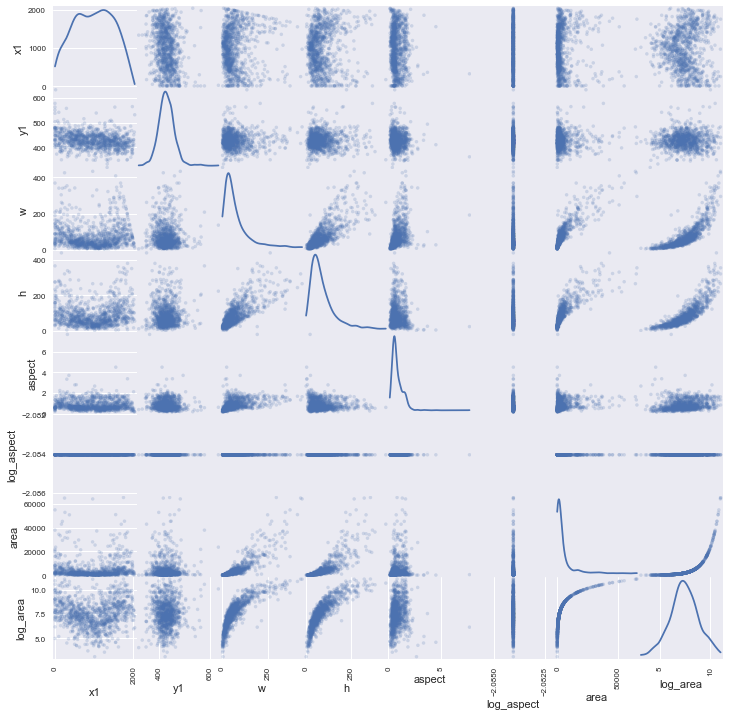

--------------------------------------------------------------------------------
class:  car


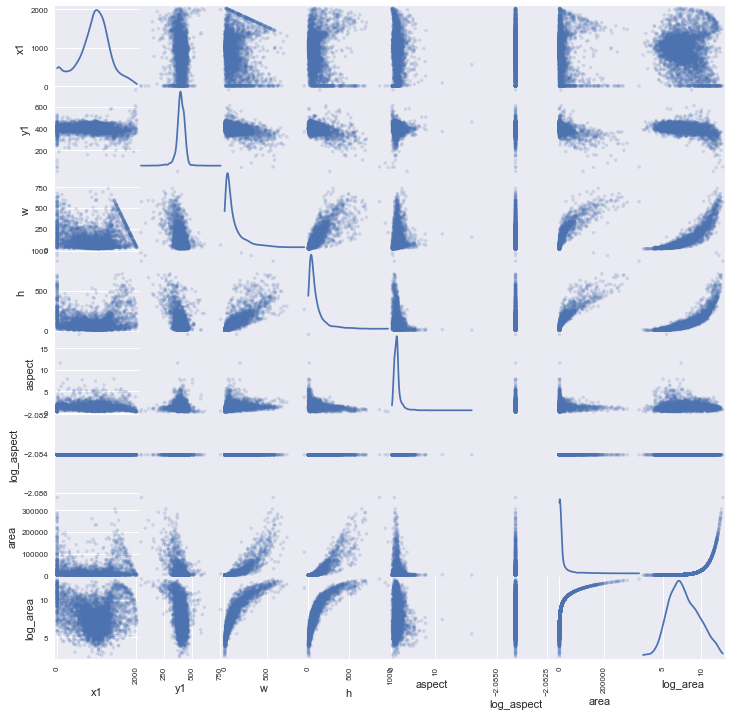

--------------------------------------------------------------------------------
class:  person


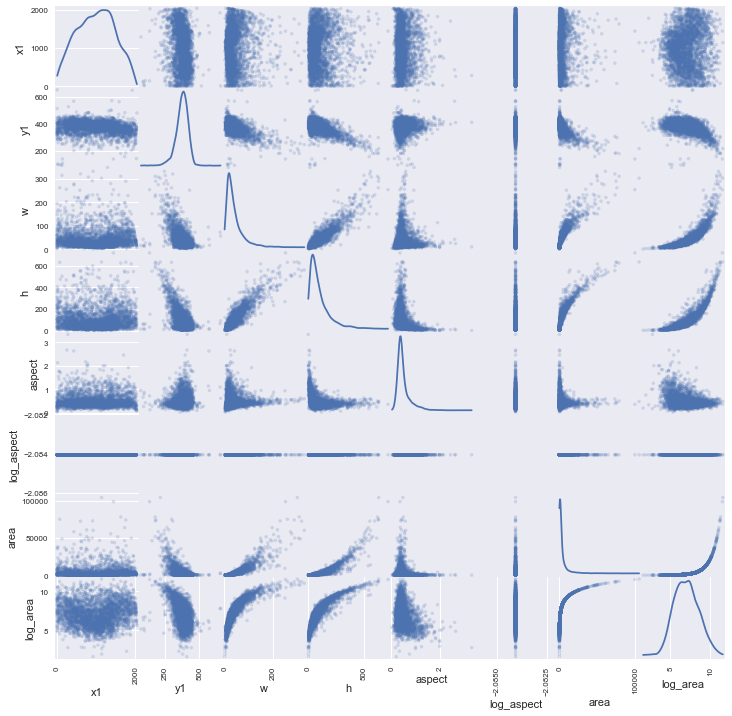

--------------------------------------------------------------------------------
class:  train


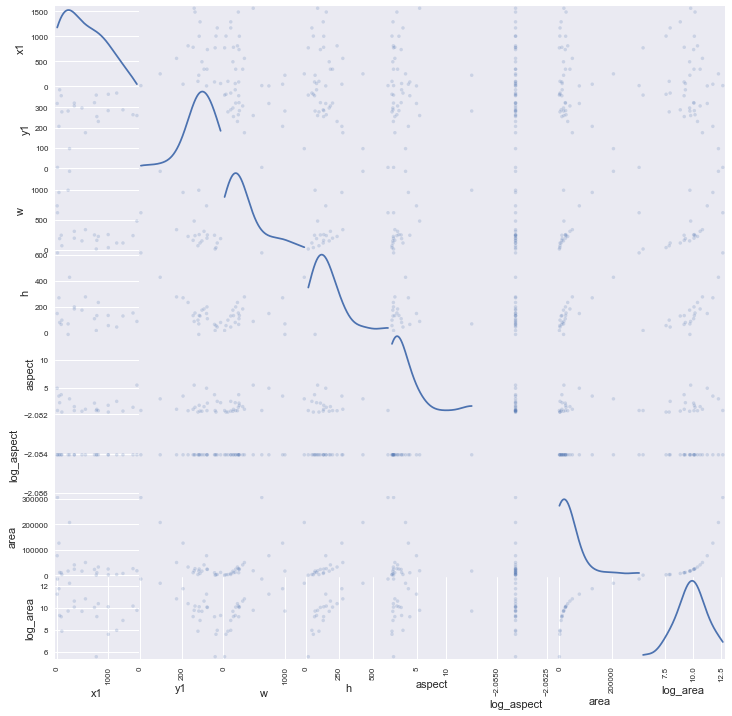

--------------------------------------------------------------------------------
class:  truck


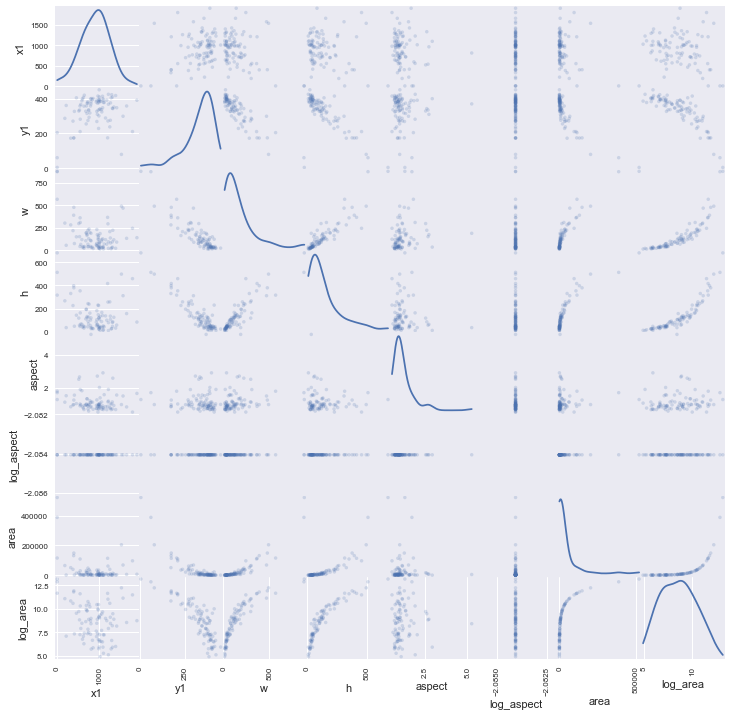

--------------------------------------------------------------------------------
class:  motorcycle


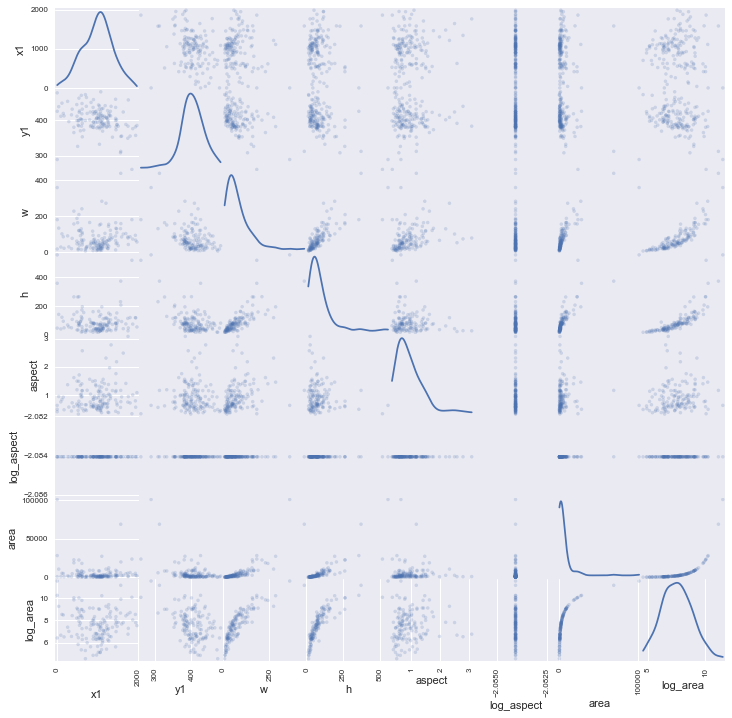

--------------------------------------------------------------------------------
class:  bus


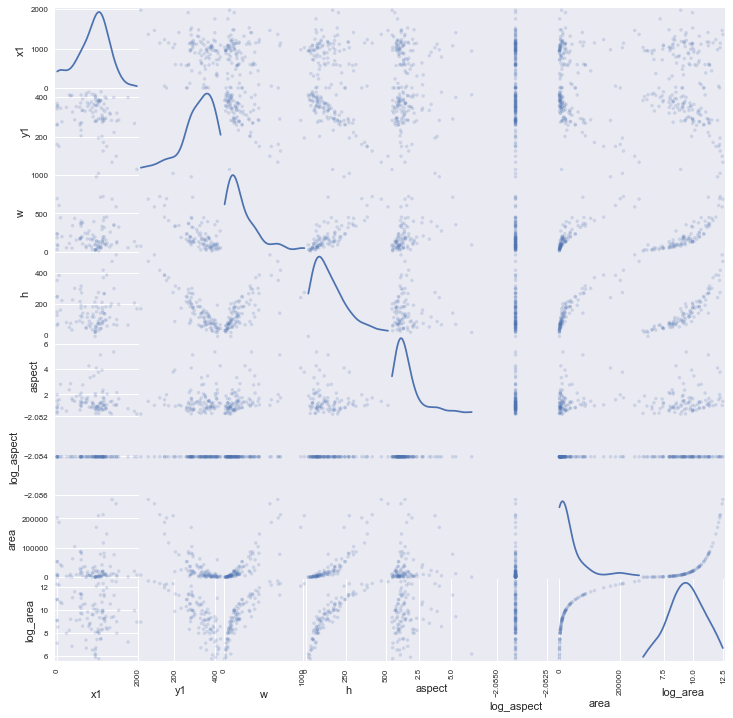

--------------------------------------------------------------------------------


In [38]:
for cls in category_instancesonly[:-1]:
    print('class: ', cls)
    df2 = df[df['category']==cls]
    df2 = df2.iloc[:,2:]
    scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
    plt.show()
    print(80*'-')

        x1     y1      w      h    aspect   area  log_area
9   1026.0  381.0   22.0   49.0  0.448980    598  6.393591
10  1186.0  357.0   62.0  131.0  0.473282   4114  8.322151
29  1442.0  302.0  129.0  296.0  0.435811  20193  9.913091
38   970.0  411.0   19.0   42.0  0.452381    391  5.968708
69   421.0  367.0   56.0  135.0  0.414815   3559  8.177235


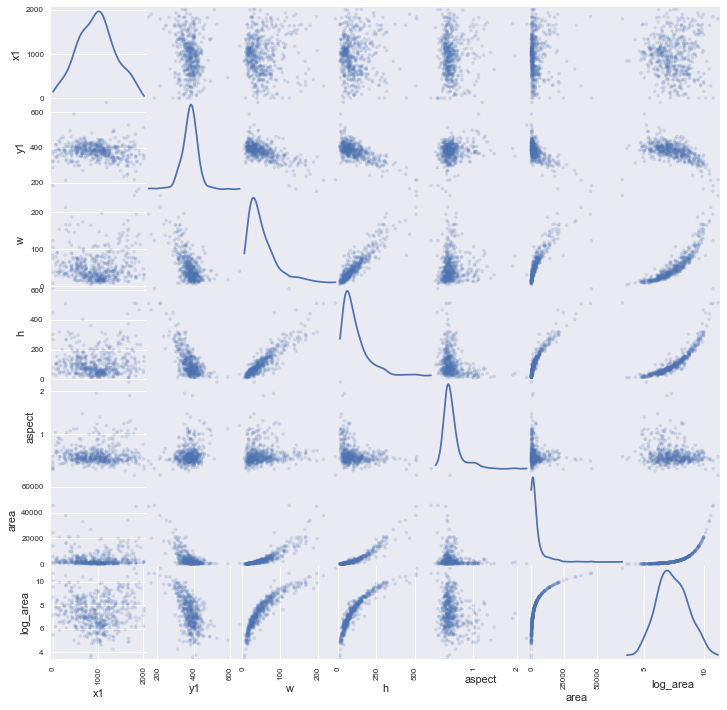

--------------------------------------------------------------------------------


In [39]:
df2 = df[df['category']=='rider']
df2 = df2.iloc[:,[2,3,4,5,6,8,9]]
print(df2.head())
scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
plt.show()
print(80*'-')

#### 使用seaborn绘制

        x1     y1      w      h    aspect   area  log_area
9   1026.0  381.0   22.0   49.0  0.448980    598  6.393591
10  1186.0  357.0   62.0  131.0  0.473282   4114  8.322151
29  1442.0  302.0  129.0  296.0  0.435811  20193  9.913091
38   970.0  411.0   19.0   42.0  0.452381    391  5.968708
69   421.0  367.0   56.0  135.0  0.414815   3559  8.177235


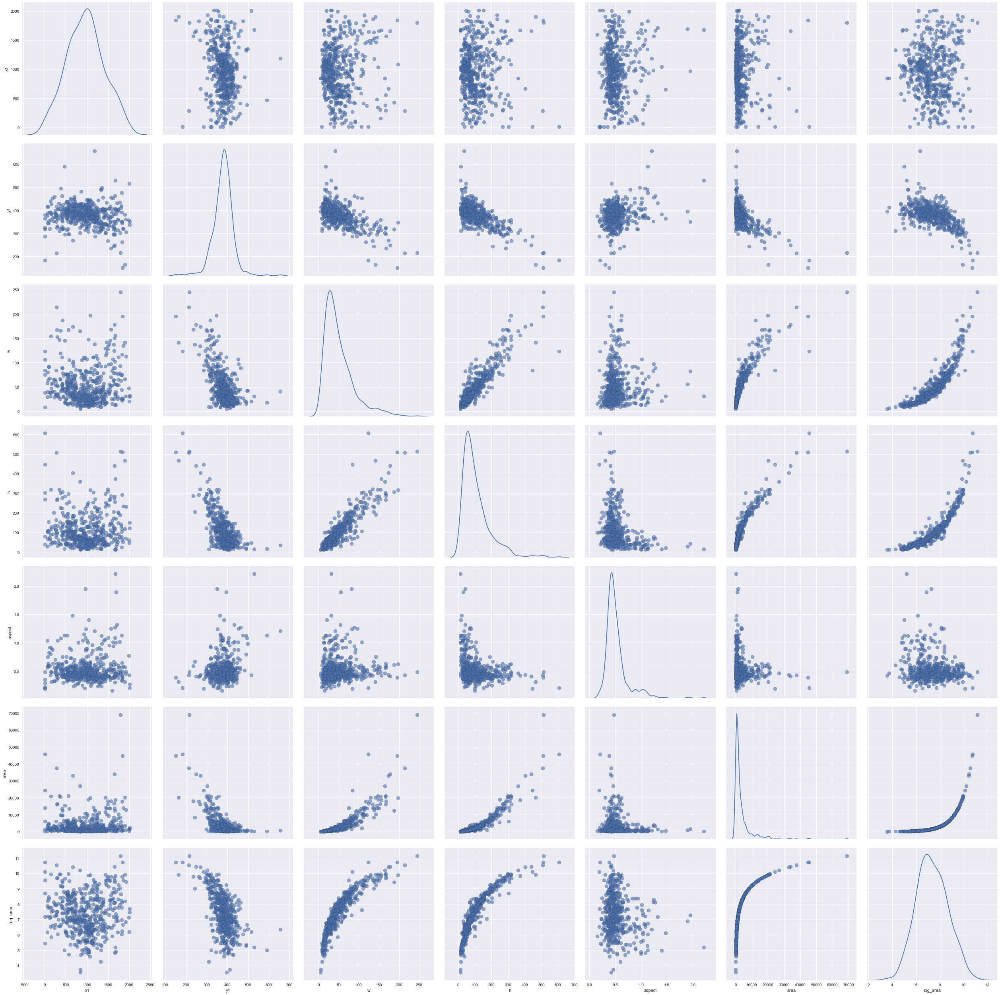

--------------------------------------------------------------------------------


In [40]:
df2 = df[df['category']=='rider']
df2 = df2.iloc[:,[2,3,4,5,6,8,9]]
print(df2.head())
# scatter_matrix(df2, alpha=0.2, figsize=(12, 12), diagonal='kde')
sns.pairplot(df2, diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 5)
plt.show()
print(80*'-')